<h1><center>Bird Species Image Recognition</center></h1>
<h3><center>Brendon Bottle and Sean McManus</center></h3>

In [1]:
import tensorflow as tf
from keras.layers import Dense, Conv2D, BatchNormalization, MaxPooling2D, Input, Flatten, Dropout, LeakyReLU
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
from sklearn.preprocessing import LabelBinarizer
import keras
from keras.models import Sequential, Model
from keras.callbacks import EarlyStopping, ModelCheckpoint
import random
from keras.applications import EfficientNetB0
import pandas as pd
import seaborn as sns
import warnings
import pickle

warnings.filterwarnings("ignore", "use_inf_as_na")

rs = 7284

np.random.seed(rs)
random.seed(rs)
tf.random.set_seed(rs)

# Load Data

Initial data source: https://www.kaggle.com/datasets/gpiosenka/100-bird-species

The inital dataset contained 100's of images for each of 525 species of bird. However, for learning and gaining knowledge on model architecture and design we decided that was too much data to be able to be constantly running for a small change. As a comprimise we randomly selected 20 different species of bird to include in the model.

The available data for each bird was originally unbalanced, we corrected this by selecting a subset of the available images and creating a balanced dataset. This subset conatined 100 images for each of the 20 different species. 

The validation and test sets were hand selected by the author of the kaggle dataset as they were considered good examples of that bird species, so we used the same he had selected as our validation and test sets. 

In [2]:
''' Original code for loading and saving data files'''

# # Set file path for loading data
# train_dir = './birds/train'
# val_dir = "./birds/valid"
# test_dir = "./birds/test"

# # Set the number of images per bird to include
# num_img = 100
# num_birds = 20

# # Instantiate the containers for holding image and label data
# train_data = []
# val_data = []
# test_data = []

# bird_num = 0
# # Load train data
# for i in os.listdir(train_dir):
#     if i.startswith('.'):
#         continue
#     bird_num +=1
#     if bird_num > num_birds:
#         break
#     count = 0
#     sub_directory = os.path.join(train_dir, i)
#     for j in os.listdir(sub_directory):
#         count+=1
#         if count > num_img:
#             break
#         img = cv2.imread(os.path.join(sub_directory, j))
#         img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#         train_data.append([img, i])
    
            
# bird_num = 0
# # Load validation data
# for i in os.listdir(val_dir):
#     if i.startswith('.'):
#         continue
#     bird_num += 1
#     if bird_num > num_birds:
#         break
#     sub_directory = os.path.join(val_dir, i)
#     for j in os.listdir(sub_directory):
#         img = cv2.imread(os.path.join(sub_directory, j))
#         img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#         val_data.append([img, i])

# bird_num = 0
# #Load test data
# for i in os.listdir(test_dir):
#     if i.startswith('.'):
#         continue
#     bird_num += 1
#     if bird_num > num_birds:
#         break
#     sub_directory = os.path.join(test_dir, i)
#     for j in os.listdir(sub_directory):
#         img = cv2.imread(os.path.join(sub_directory, j))
#         img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#         test_data.append([img, i])

# print(len(train_data))
# print(len(val_data))
# print(len(test_data))

# pickle.dump(train_data, open('./saved_data/bird_train_data.pkl', 'wb'))
# pickle.dump(val_data, open('./saved_data/bird_val_data.pkl', 'wb'))
# pickle.dump(test_data, open('./saved_data/bird_test_data.pkl', 'wb'))

' Original code for loading and saving data files'

During data loading we had issues with being on different OS platforms, and filestructures. We solved this issue by using a pickle file to ensure images and birds were being loaded in the same order for all users.

In [3]:
num_birds = 20
num_img = 100

train_data = pickle.load(open('./saved_data/bird_train_data.pkl', 'rb'))
val_data = pickle.load(open('./saved_data/bird_val_data.pkl', 'rb'))
test_data = pickle.load(open('./saved_data/bird_test_data.pkl', 'rb'))

In [4]:
bird_names = ['ALEXANDRINE PARAKEET',
 'ARARIPE MANAKIN',
 'ASIAN CRESTED IBIS',
 'BALD EAGLE',
 'BALD IBIS',
 'BLUE HERON',
 'BOBOLINK',
 'BORNEAN PHEASANT',
 'CALIFORNIA QUAIL',
 'CAMPO FLICKER',
 'CEDAR WAXWING',
 'COPPERSMITH BARBET',
 'CUBAN TROGON',
 'D-ARNAUDS BARBET',
 'EURASIAN BULLFINCH',
 'EURASIAN GOLDEN ORIOLE',
 'FLAME TANAGER',
 'FRILL BACK PIGEON',
 'GAMBELS QUAIL',
 'GREAT KISKADEE']

In [5]:
# Check if all images are the same shape

count_t = 0
count_v = 0

for t in train_data:
    if t[0].shape != (224, 224, 3):
        count_t += 1
    
for v in val_data:
    if v[0].shape != (224, 224, 3):
        count_v += 1

print(f'There are {count_t} images of different shape in the train data.\nThere are {count_v} images of different shape in the validation data.')
    

There are 0 images of different shape in the train data.
There are 0 images of different shape in the validation data.


# Explore Data

The random selection of birds includes a wide variety of birds in size, coloration, shape, and poses. The images are already closely cropped, and the birds are genreally centered, but there is a lot of background noise between the images. Particularly for the smaller birds that mostly are perched on top of plants. 

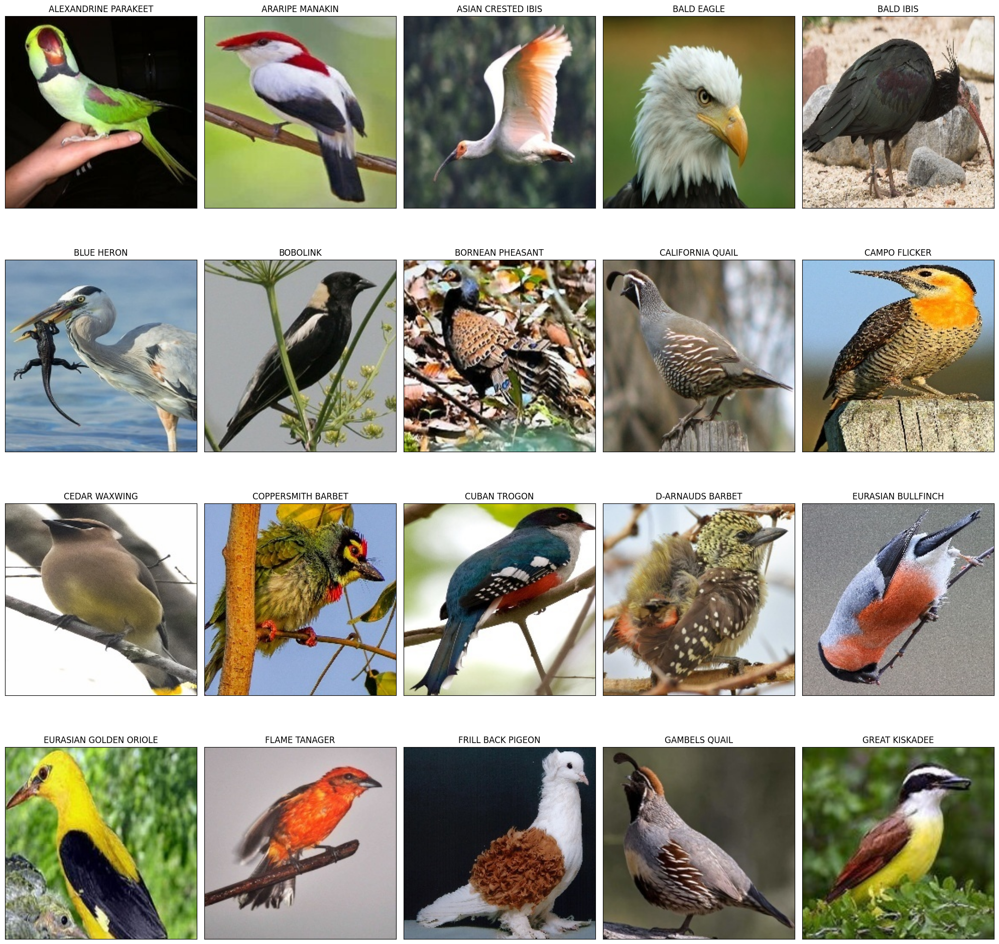

In [6]:
# Show an image for each bird
fig, axs = plt.subplots(int(num_birds/5), 5, figsize=(20, 20))

axs = axs.ravel()

ax = 0
for idx in np.arange(0, num_birds*num_img, num_img):
    bird = train_data[idx][1]
    img = train_data[idx][0]
    axs[ax].xaxis.set_ticks([])
    axs[ax].yaxis.set_ticks([])
    axs[ax].set_title(bird)
    # Note that cv2 reads images in BGR, but plt.imshow is expecting RGB, cvtColor reverses the channels so the correct color is shown when plotted. 
    axs[ax].imshow(img)
    ax +=1

plt.tight_layout()
plt.show()

# Preapre Data for Training

Because this is image data, and we've already confirmed they are the same shape, there is less cleaning than we'd need to do with other types of data. However, we do need to prepare the data for our model. We'll need to do a few things for this:

- Shuffle the data in case the images were loaded in any particular order. 
- Split the X features (pixel information) and y labels (bird names)
- Vectorize the y values to allow for machine interpretation. 

Because the baseline mdoel we'll use (EfficientNet) has a scaling layer added into it already, we won't normalize the data here. Instead we'll do that when we call model.fit() as needed.

In [7]:
# Shuffle data to randomize batches

np.random.seed(rs)
np.random.shuffle(train_data)
np.random.shuffle(val_data)

In [8]:
# Preprocess training data and validation data
lb = LabelBinarizer()

X_train = []
y_train = []
for x, y in train_data:
    X_train.append(x)
    y_train.append(y)

X_train = np.array(X_train)
y_train = np.array(y_train)

y_train_vect = lb.fit_transform(y_train)

X_val = []
y_val = []
for x, y in val_data:
    X_val.append(x)
    y_val.append(y)

X_val = np.array(X_val)
y_val = np.array(y_val)

y_val_vect = lb.fit_transform(y_val)

# Function Creation

We'll first create few functions that we'll need for running and evaluating models.

In [9]:
def set_callbacks(filename, patience= 8, start_from_eopch= 10):

    '''Sets early stopping and model checkpoint variables
    
        Args:
            filename (str): Filename/path for saving
            patience (int): How many epochs to wait before stopping (default 8)
            start_from_epoch (int): What epoch to start checking validation accuracy (default 10)

        Returns:
            stopping: EarlyStopping call
            checkpoint: ModelCheckpoint call
    '''

    stopping = EarlyStopping(monitor= 'val_accuracy', patience= 8, start_from_epoch=10, restore_best_weights= True)
    checkpoint = ModelCheckpoint(filename, monitor = 'val_accuracy', save_best_only= True)

    return stopping, checkpoint

def plot_loss (mod_hist):

    '''Plots the loss and accuracy for model training
    
        Args:
            mod_hist: History results from a model.fit() call
    '''

    results_df = pd.DataFrame({'Train Accuracy': mod_hist.history['accuracy'],
                           'Val Accuracy': mod_hist.history['val_accuracy'],
                           'Train Loss': mod_hist.history['loss'],
                           'Val Loss': mod_hist.history['val_loss']
                           })

    fig, axs = plt.subplots(ncols=2, figsize = (12, 4))

    sns.lineplot(results_df['Val Loss'], ax= axs[0], label = 'Val Loss')
    sns.lineplot(results_df['Train Loss'], ax= axs[0], label = 'Train Loss')

    sns.lineplot(results_df['Val Accuracy'], ax= axs[1], label = 'Val Acc')
    sns.lineplot(results_df['Train Accuracy'], ax= axs[1], label = 'Train Acc')

    # axs[1].set_yticks(np.arange(.1, 1.01, .05))
    # axs[0].set_yticks(np.arange(0, 5.1, .2))

    plt.legend()

    plt.show()

def model_setup(rs=7284):
    '''Sets the 3 seeds necessary for consistency in keras'''
    np.random.seed(rs)
    random.seed(rs)
    tf.random.set_seed(rs)
    
def resize_img(X_train ,X_val, new_size):
    '''Resizes an array of images

        Args:
            X_train (array): Array of image data for training
            X_val (array): Array of img data for validation
            new_size (tuple): The shape to resize the images to

        Returns:
            X_train_rs (array): An array of the same length as X_train with images resized
            X_val_rs (array): An array of the same length as X_val with images resized

    '''
    X_train_rs = []
    X_val_rs = []

    #Resize training data
    for img in X_train:
        rsimg = cv2.resize(img, new_size)
        X_train_rs.append(rsimg)

    X_train_rs = np.array(X_train_rs)

    # Resize validation data
    for img in X_val:
        rsimg = cv2.resize(img, new_size)
        X_val_rs.append(rsimg)

    X_val_rs = np.array(X_val_rs)

    return X_train_rs, X_val_rs

def pred_eval(model, X = X_val, y= y_val):

    ''' Evaluates predictions for specificed model

        Args:
            model: The model to be used for predictions

        Returns:
            preds (df): A dataframe of the ground truth and predicted class labels for each observation
    
    '''
     
    predictions = np.argmax(model.predict(X), axis=1)

    y_hat = np.array([bird_names[i] for i in predictions])

    preds = pd.DataFrame({'y_true': y,
                                'y_hat': y_hat
                                })
    
    return preds

def count_correct(preds):

    '''Creates a dummary dataframe counting the total correct predictions for each bird species
    
        Args:
            preds (df): The output dataframe from pred_eval()

        Returns:
            correct_count(df): A dataframe with each bird name and the total number correctly predicted
    '''

    # Look at number of correct predictions for each bird
    preds['Correct'] = preds.apply(lambda x: 0 if x['y_true'] != x['y_hat'] else 1, axis= 1)

    correct_count = pd.DataFrame(preds.groupby(by='y_true').sum()['Correct'])

    return correct_count

def show_class(bird, preds):

    '''Shows validation images and predicted class for specified species, divided by incorrect and correct if applicable

        Args:
            bird (str): Name of bird to show
            preds (df): The output dataframe from pred_eval()
    '''

    # List the indexes for the worst bird correctly and incorrectly predicted and show images
    wrong_bird = list(preds[(preds['y_true'] == bird) & (preds['y_hat'] != bird)].index)
    right_bird = list(preds[(preds['y_true'] == bird) & (preds['y_hat'] == bird)].index)

    if len(wrong_bird) > 0:

        print(f'Incorrectly labeled {bird}')
        fig, axs = plt.subplots(ncols=len(wrong_bird), figsize = (15, 5))

        for idx, i in enumerate(wrong_bird):
            if len(wrong_bird) > 1:
                ax = axs[idx]
            elif len(wrong_bird) <= 1:
                ax = axs

            ax.imshow(X_val[i])
            ax.xaxis.set_ticks([])
            ax.xaxis.set_ticks([])
            ax.set_title(preds['y_hat'][i])
            ax.axis('off')
        
        plt.tight_layout()
        plt.show()

    if len(right_bird) > 0: 

        print(f'Correctly labeled {bird}')

        fig, axs = plt.subplots(ncols=len(right_bird), figsize = (10, 5))

        for idx, i in enumerate(right_bird):

            if len(right_bird) > 1:
                ax = axs[idx]
            elif len(right_bird) <= 1:
                ax = axs

            ax.imshow(X_val[i])
            ax.xaxis.set_ticks([])
            ax.xaxis.set_ticks([])
            ax.set_title(preds['y_hat'][i])
            ax.axis('off')
            
        plt.tight_layout()
        plt.show()

def plot_birds(birds, num_show):
    '''Shows the selected number of images from teh training set for the selected species of birds
    
        Args:
            birds (list): A list of the name(s) of bird(s) that you want to show
            num_show(int): The number of images to show for each species
    '''
    for bird in birds:
        fig, axs = plt.subplots(ncols= num_show, figsize = (20, 5))

        bird_imgs = X_train[y_train == bird][:num_show]

        for idx, b in enumerate(bird_imgs):

            axs[idx].imshow(b)
            axs[idx].xaxis.set_ticks([])
            axs[idx].xaxis.set_ticks([])
            axs[idx].axis('off')
            
        fig.suptitle(bird)
        plt.tight_layout()
        plt.show()


# Check Baseline

To validate that this is a problem we'll be able to solve with a reasonable level of accuracy, we'll set a baseline expectation for how well our model could potentially perform using EfficientNetB0, a popular pre-trained model used for image classification. We'll just run it for 5 epochs to get an idea of what kind of accuracy we might expect to be able to get from this dataset.

In [10]:
# Just running a couple epochs on baseline to validate that it should still be able to get decent results
keras.backend.clear_session()
model_setup()
# Load Model 
enet = EfficientNetB0(include_top= False, input_shape=(224, 224, 3), weights= 'imagenet')

layers = enet.layers

for layer in layers:
    layer.trainable = False

# Add a flatten and softmax layer
base_model= Sequential([
    enet,
    Flatten(),
    Dense(num_birds, activation='softmax')
])

# Compile model
base_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

base_history = base_model.fit(x = X_train, y= y_train_vect, batch_size=80, validation_data= (X_val, y_val_vect), verbose = 1, epochs = 5)

Epoch 1/5
25/25 [==============================] - 20s 728ms/step - loss: 0.9192 - accuracy: 0.8315 - val_loss: 0.2380 - val_accuracy: 0.9600
Epoch 2/5
25/25 [==============================] - 18s 711ms/step - loss: 0.1177 - accuracy: 0.9835 - val_loss: 0.0883 - val_accuracy: 0.9800
Epoch 3/5
25/25 [==============================] - 18s 724ms/step - loss: 0.0199 - accuracy: 0.9960 - val_loss: 0.0258 - val_accuracy: 0.9900
Epoch 4/5
25/25 [==============================] - 18s 739ms/step - loss: 0.0130 - accuracy: 0.9950 - val_loss: 0.0015 - val_accuracy: 1.0000
Epoch 5/5
25/25 [==============================] - 18s 706ms/step - loss: 0.0029 - accuracy: 0.9995 - val_loss: 0.0018 - val_accuracy: 1.0000


# Simple Model

With only 5 epochs, we already had an average accuracy of about 97%, so this is clearly a problem that can be solved very well by a properly trained neural net. To give ourselves a starting point, we'll build a very simple model just using 1 CNN layer, a pooling layer, and a softmax for predictions. We'll use 32 filters, a 3x3 kernel, and rmsprop as an optimizer. Because we balanced our classes, accuracy will be a reasonable metric to use for evaluation, although we will want to check the actual class predictions to determine which classes our model struggles with the most. 

We'll use early stopping to limit run times and to avoid overfitting on this model.

In [11]:
keras.backend.clear_session()

model_setup()

inputs = Input(shape=(224, 224, 3))

cnn1 = Conv2D(32, 3, activation="leaky_relu")(inputs)

pool1 = MaxPooling2D(2)(cnn1)

flat = Flatten()(pool1)

predictions = Dense(num_birds, activation='softmax')(flat)

simp_model = Model(inputs=inputs, outputs=predictions)

simp_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 394272)            0         
                                                                 
 dense (Dense)               (None, 20)                7885460   
                                                                 
Total params: 7886356 (30.08 MB)
Trainable params: 7886356 (30.08 MB)
Non-trainable params: 0 (0.00 Byte)
_____________________

In [12]:
# Fit model
stopping, checkpoint = set_callbacks('simple_model.keras')

simp_model.compile(optimizer='rmsprop', loss= 'categorical_crossentropy', metrics=['accuracy'])

simp_history = simp_model.fit(x = X_train/255, y= y_train_vect, batch_size=128, validation_data= (X_val/255, y_val_vect), verbose = 0, epochs = 100, callbacks=[stopping, checkpoint])

simp_model.evaluate(X_val/255, y_val_vect)

4/4 [==============================] - 0s 29ms/step - loss: 0.9711 - accuracy: 0.7700


[0.9711107611656189, 0.7699999809265137]

## Model Evaluation

Our model performed suprisingly well for such a simple model. With only 20 epochs we were able to get our model up to 81% accuracy. However, looking at our loss and accuracy over the epochs, we can see that the model is overfitting the training data. Our training accuracy jumps up to 100% relatively quickly while the validation accuracy seems to have leveled out, and is starting to drop as we reach the 20th epoch.

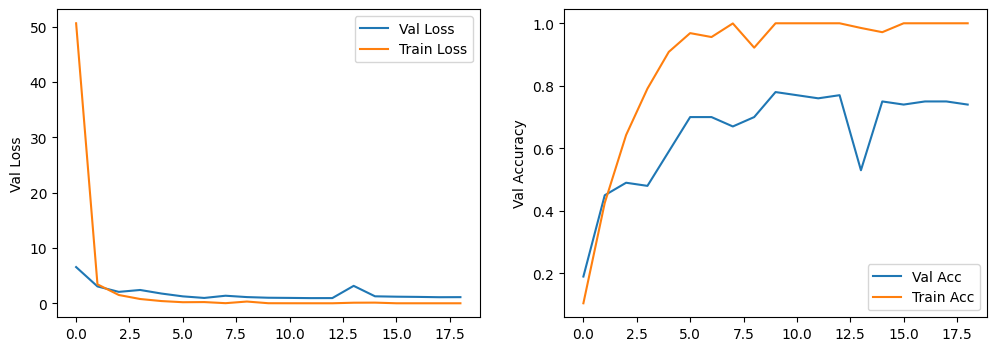

In [13]:
# Look at epoch loss/accuracy
plot_loss(simp_history)

## Prediction Evaluation

Let's now look at what our model actually predicted and how it did on different classes. We can see already that, while the overall accuracy was good, only 4 of our 20 species were correctly predicted 100% of the time and Bald Eagles were incoreectly classified every time. So our models clearly needs some work

In [14]:
simp_preds = pred_eval(simp_model)
simp_correct_count = count_correct(simp_preds)
simp_correct_count.sort_values(by='Correct')

4/4 [==============================] - 0s 29ms/step


,Correct
y_true,
BALD EAGLE,0
BALD IBIS,1
BLUE HERON,1
FLAME TANAGER,2
D-ARNAUDS BARBET,2
ALEXANDRINE PARAKEET,3
ARARIPE MANAKIN,3
ASIAN CRESTED IBIS,3
FRILL BACK PIGEON,3


## Images of Incorrect Bird Classifications

As a first step we will look the images that were misclassified and compare them to their predicted labels to see if there's might be an obvious reason our model misclassified them. The two worst predicted classes were the Bald Eagle and Blue Heron.

For the Bald Eagle, the flying picture being misclassified is understadable as it may not have encountered an in flight eagle in training and unless its learned the coloration of the head  and body extremely well it would be challenging to make that leap.

Looking at the training images we we have a lot of images of the Asian Crested Ibis flying, so the simple model likely just connects open wings with that bird. The frill back pigeion appears to be related based on the brown/white coloration.

But we were stumped as to why it would predict the Alexandrine Parakeet on this bald eagle, the parakeet is a brightly colored green bird with a large orange beak.

The Blue Heron was classified as the Frill Back Pigeon, Ibis and Pheasant. We began to think that this was indicative that our simple model was learning the basic color patterns for a species but not so much the structure of the bird itself. This is effect is magnified because the dataset ensures that each bird occupies atleast 50% of the pixels so the scale of the bird will be a less defining feature in our model.

Incorrectly labeled BALD EAGLE


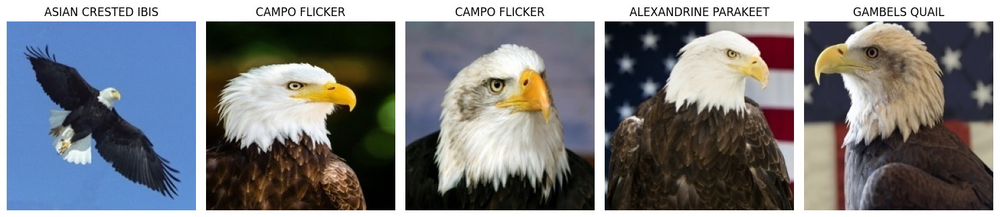

Incorrectly labeled BLUE HERON


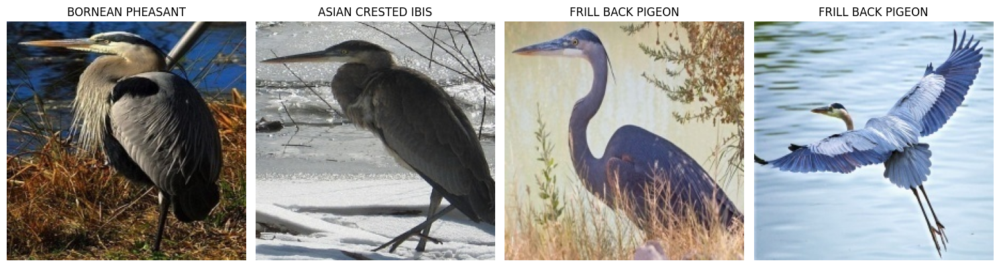

Correctly labeled BLUE HERON


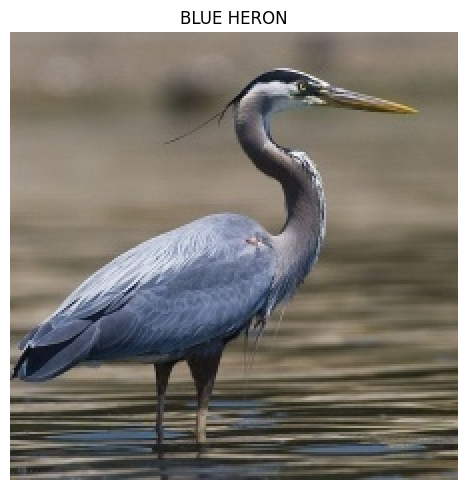

In [15]:
show_class('BALD EAGLE', simp_preds)

show_class('BLUE HERON', simp_preds)

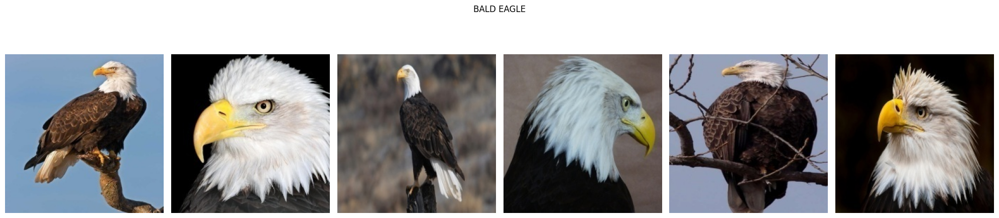

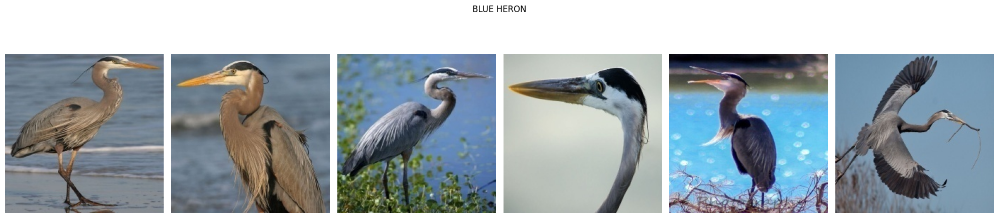

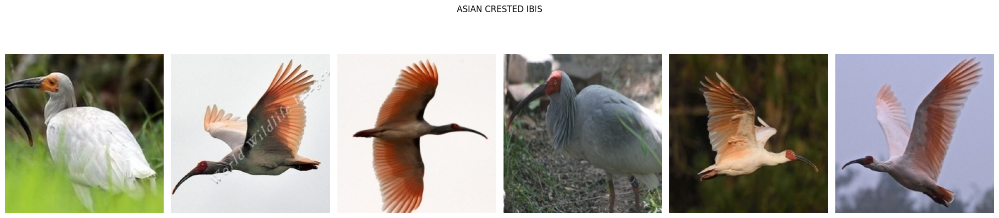

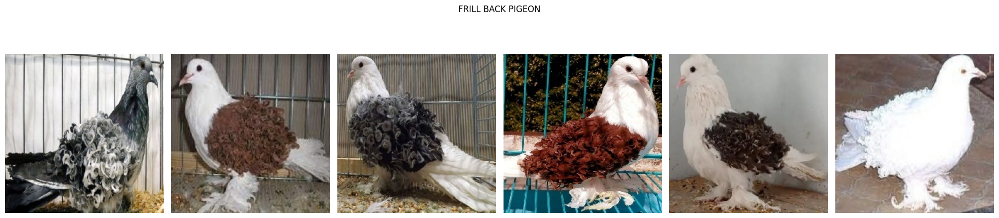

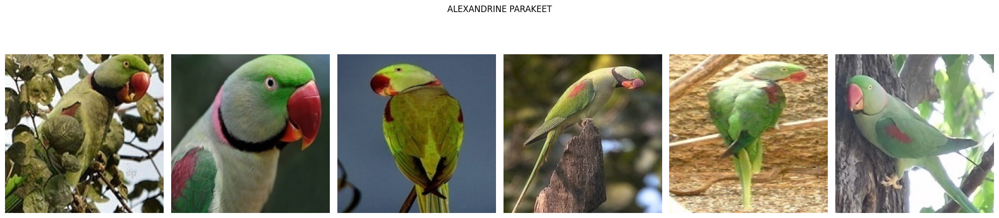

In [16]:
plot_birds(['BALD EAGLE', 'BLUE HERON', 'ASIAN CRESTED IBIS', 'FRILL BACK PIGEON', 'ALEXANDRINE PARAKEET'], 6)

## Images of Correct Bird Classifications

We've seen where the model is falling short but where is it performing really well, to get an idea lets look at where the model predicted species correct every time.

Looking at these birds, it does appear that they each have something distinctive about them. For teh Barbet and the Trogon they have very distinctive coloration, whiel the Quail and the Ibis have unique features on their head/face. Additionally, as noted earlier, the Ibis seems to be depicted as flying quite frequently making is distinctive for the pose as well. 

In [17]:
simp_correct_count[(simp_correct_count['Correct']==5) | (simp_correct_count['Correct']==4)]

,Correct
y_true,
BOBOLINK,4
BORNEAN PHEASANT,5
CALIFORNIA QUAIL,4
CAMPO FLICKER,4
COPPERSMITH BARBET,4
CUBAN TROGON,5
EURASIAN BULLFINCH,4
GAMBELS QUAIL,5
GREAT KISKADEE,5


Correctly labeled CUBAN TROGON


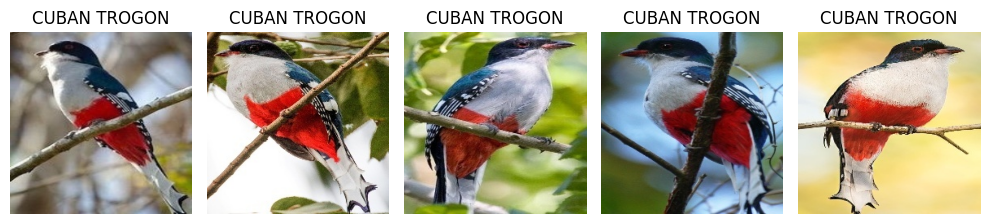

Correctly labeled GAMBELS QUAIL


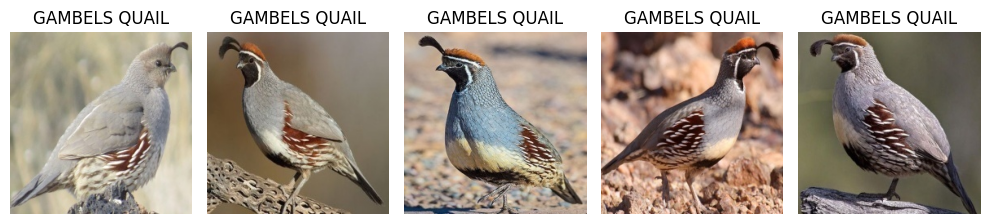

In [18]:
# Look at correctly classified birds

show_class('CUBAN TROGON', simp_preds)
show_class('GAMBELS QUAIL', simp_preds)


# Model Complexity Test

Looking where our model is predicting very accurately gives us a few insights:
+ Coloration seems to be the prominant feature it is learning
+ Birds with very distinctive features and sharp lines are predicted well

This leads us to believe that our simple model is limited to pretty "shallow" learning, and that's not extremely surprising as we have only a single convolution layer.

In order to predict birds based on more subtle but unique features, we can try to increase our models complexity by adding another set of CCN and Pooling layers.

In [19]:
keras.backend.clear_session()
model_setup()

comp_model = Sequential()

comp_model.add(Conv2D(32, 3, activation='leaky_relu', input_shape=(224, 224, 3)))

comp_model.add(MaxPooling2D(2))

comp_model.add(Conv2D(32, 3, activation='leaky_relu'))

comp_model.add(MaxPooling2D(2))

comp_model.add(Conv2D(32, 3, activation='leaky_relu'))

comp_model.add(MaxPooling2D(2))

# comp_model.add(Dropout(.2))

comp_model.add(Flatten())

# comp_model.add(Dense(128, activation='leaky_relu'))

comp_model.add(Dense(num_birds, activation='softmax'))

comp_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 32)      9248      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 32)        9248      
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 32)        0

In [20]:
stopping, checkpoint = set_callbacks('complex_model.keras')

comp_model.compile(optimizer='rmsprop', loss= 'categorical_crossentropy', metrics=['accuracy'])

comp_history = comp_model.fit(x = X_train/255, y= y_train_vect, batch_size=128, validation_data= (X_val/255, y_val_vect), verbose = 0, epochs = 100, callbacks=[stopping, checkpoint])

comp_model.evaluate(X_val/255, y_val_vect)

4/4 [==============================] - 0s 52ms/step - loss: 0.9795 - accuracy: 0.7900


[0.9794660210609436, 0.7900000214576721]

## Model Evaluation

Increasing the complexity didn't drastically improve our model, we see a small increase in the validation accuracy. We notice again that our model is shooting up to near 100% on training very quickly while validation leveled out relatively quickly. 

But before we write it off completely, we'll look at whether the specific classes are still having the same issues. 

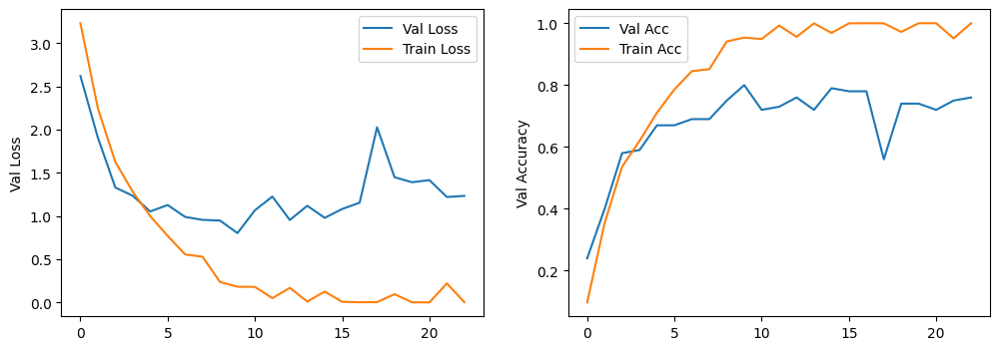

In [21]:
plot_loss(comp_history)

## Prediction Evaluation

Looking at the predictions, while our overall accuracy stayed somewhat steady, when we look at our ability to predict individual class accuracy we see some improvements. We now have more classes being with 100% accuracy, and our Bald Eagle class has one correct prediction. So the increased complexity does appear to be helping the model learn more nuanced information about the data. 

To evaluate what this model might be doing right, we can again look at the images from the actual classes. 

In [22]:
comp_preds = pred_eval(comp_model)
comp_correct = count_correct(comp_preds)

print(f'Complex Model: {comp_correct.sort_values("Correct")}\n')
print(f'Simple Model: {simp_correct_count.sort_values("Correct")}')

4/4 [==============================] - 0s 48ms/step
Complex Model:                         Correct
y_true                         
BALD EAGLE                    1
BALD IBIS                     1
BLUE HERON                    3
BOBOLINK                      3
FLAME TANAGER                 3
CEDAR WAXWING                 3
COPPERSMITH BARBET            3
D-ARNAUDS BARBET              3
FRILL BACK PIGEON             4
ASIAN CRESTED IBIS            4
EURASIAN GOLDEN ORIOLE        4
EURASIAN BULLFINCH            4
ALEXANDRINE PARAKEET          5
CAMPO FLICKER                 5
GAMBELS QUAIL                 5
CALIFORNIA QUAIL              5
BORNEAN PHEASANT              5
ARARIPE MANAKIN               5
CUBAN TROGON                  5
GREAT KISKADEE                5

Simple Model:                         Correct
y_true                         
BALD EAGLE                    0
BALD IBIS                     1
BLUE HERON                    1
FLAME TANAGER                 2
D-ARNAUDS BARBET      

## Images of Incorrect Classifications

We see that Bald Eagle and the bald ibis are still doing poorly but we saw an improvement in Blue Heron classification.

For the Bald Eagle, its a bit all over the place but the model is no longer confusing it with Frill Back Pigeons, so it seems like there's been improvement on our models bias to go purely off of color. 

The Bald Ibis however seems to be misclassified as a campo flicker. This is a bit surprising as they are quite different. I'm not sure exactly what the model is looking at to make those predictions. 

Incorrectly labeled BALD EAGLE


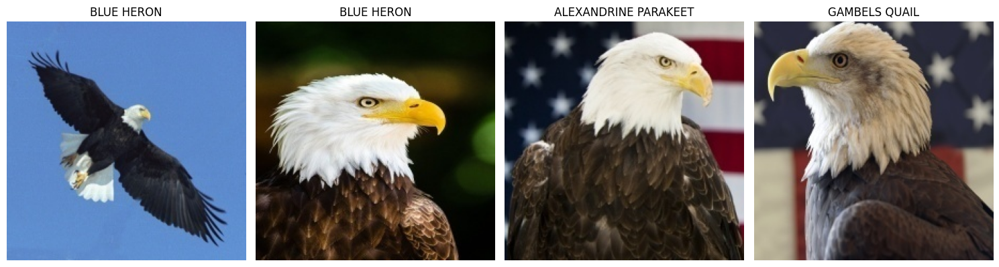

Correctly labeled BALD EAGLE


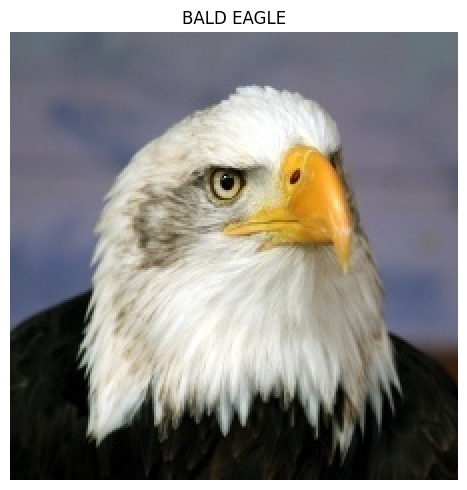

Incorrectly labeled BALD IBIS


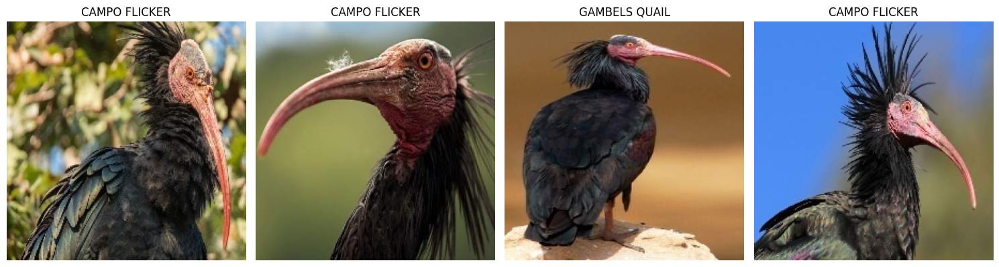

Correctly labeled BALD IBIS


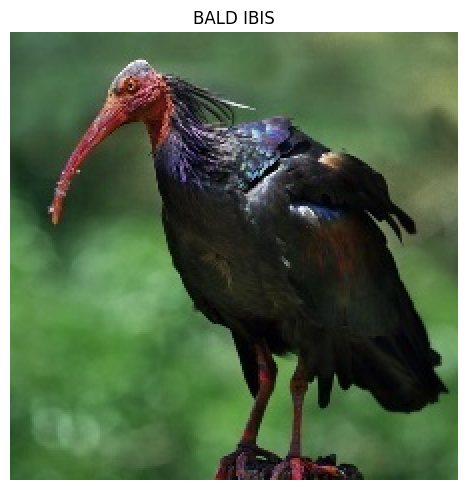

In [33]:
show_class('BALD EAGLE', preds)

show_class('BALD IBIS', preds)

## Images of Correct Classifications

Let's now look at the birds that were correctly classified and see what the model is doing well. 

Once again, the majority of correctly classified birds seem to have some specific, distinctive feature. And again, bright color patches seems to be a good indicator of a bird being predicted. This, combined with the models quick jump to overfitting, indicate that the model may be learning these features too well in the early layers, making it inflexible to learning the more nuanced features of the other types of birds. Color in particular seems to be a focus for the model. We cna test this by training the model on grayscale versions of the image and seeing if it still performs at about the same level. 

Correctly labeled GAMBELS QUAIL


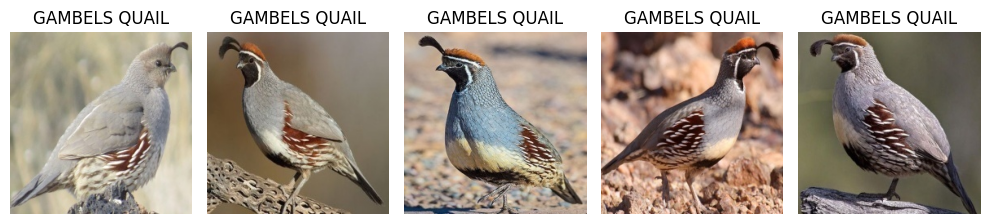

Incorrectly labeled EURASIAN BULLFINCH


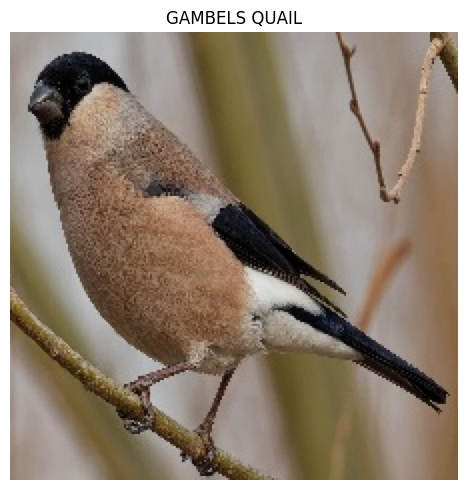

Correctly labeled EURASIAN BULLFINCH


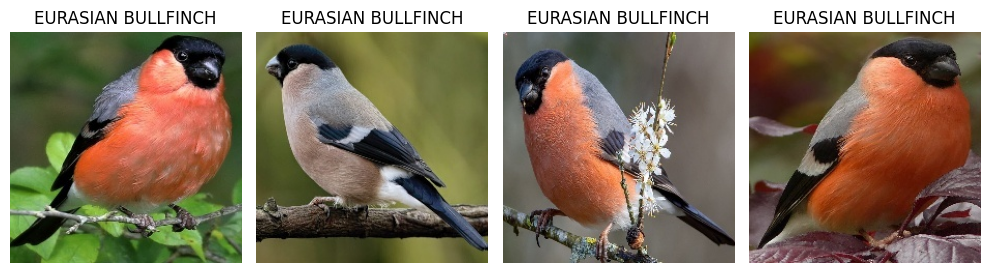

Correctly labeled CALIFORNIA QUAIL


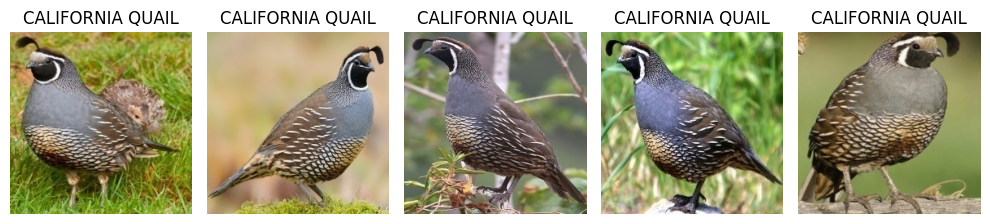

Correctly labeled BORNEAN PHEASANT


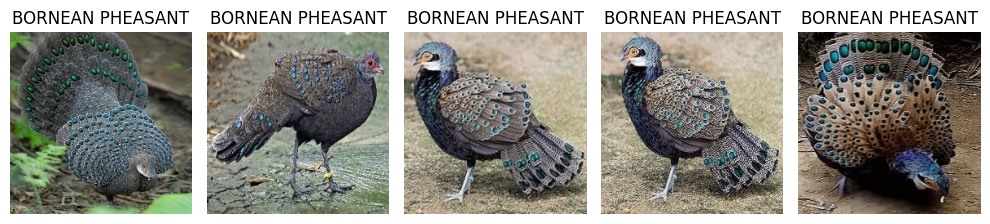

Correctly labeled ARARIPE MANAKIN


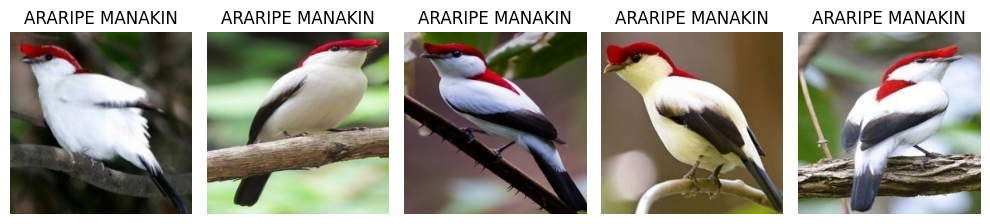

Correctly labeled CUBAN TROGON


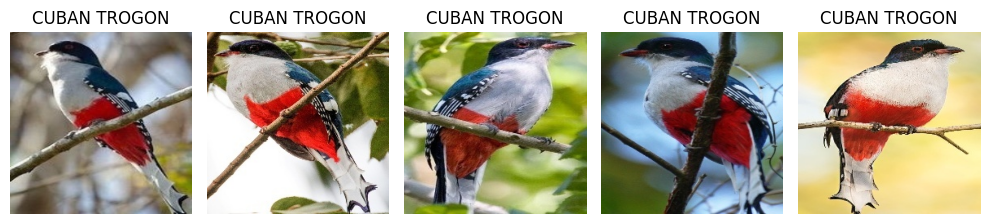

In [24]:
show_class('GAMBELS QUAIL', comp_preds)
show_class('EURASIAN BULLFINCH', comp_preds)
show_class('CALIFORNIA QUAIL', comp_preds)
show_class('BORNEAN PHEASANT', comp_preds)
show_class('ARARIPE MANAKIN', comp_preds)
show_class('CUBAN TROGON', comp_preds)

# Grayscale Model Testing
One idea we had was to remove color from the images to see if the model learned a birds structure better than simply its color patterns.

In [56]:
grey_train = []
for i,j in train_data:
    img = cv2.cvtColor(i, cv2.COLOR_BGR2GRAY)
    grey_train.append([img, j])
print(len(grey_train))

grey_val = []
for i,j in val_data:
    img = cv2.cvtColor(i, cv2.COLOR_BGR2GRAY)
    grey_val.append([img, j])
print(len(grey_val))


2000
100


In [57]:
# prep greyscale data
# Shuffle data to randomize batches
np.random.seed(rs)
np.random.shuffle(grey_train)
np.random.shuffle(grey_val)

X_grey_train = []
y_grey_train = []
for x, y in grey_train:
    X_grey_train.append(x)
    y_grey_train.append(y)

X_grey_train = np.array(X_grey_train)
y_grey_train = np.array(y_grey_train)

y_grey_train_vect = lb.fit_transform(y_grey_train)

X_grey_val = []
y_grey_val = []
for x, y in grey_val:
    X_grey_val.append(x)
    y_grey_val.append(y)

X_grey_val = np.array(X_grey_val)
y_grey_val = np.array(y_grey_val)

y_grey_val_vect = lb.fit_transform(y_grey_val)

In [58]:
keras.backend.clear_session()
model_setup()

grey_model = Sequential()

grey_model.add(Conv2D(32, 3, activation='leaky_relu', input_shape=(224, 224, 1)))

grey_model.add(MaxPooling2D(2))

grey_model.add(Conv2D(32, 3, activation='leaky_relu'))

grey_model.add(MaxPooling2D(2))

grey_model.add(Conv2D(32, 3, activation='leaky_relu'))

grey_model.add(MaxPooling2D(2))

grey_model.add(Flatten())

grey_model.add(Dense(num_birds, activation='softmax'))

grey_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 32)      9248      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 32)        9248      
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 32)        0

In [59]:
# Fitting the greyscale model

stopping, checkpoint = set_callbacks('grey_model.keras')

grey_model.compile(optimizer='rmsprop', loss= 'categorical_crossentropy', metrics=['accuracy'])

grey_history = grey_model.fit(x = X_grey_train/255, y= y_grey_train_vect, batch_size=128, validation_data= (X_grey_val/255, y_grey_val_vect), verbose = 0, epochs = 100,callbacks=[stopping, checkpoint])

#print(grey_history.history.keys())
max_val = max(grey_history.history['val_accuracy'])
max_train = max(grey_history.history['accuracy'])

print(f'The maximum traing accuracy was {round(max_train,3)} \nThe maximum validation accuracy was {round(max_val,3)} ')

The maximum traing accuracy was 1.0 
The maximum validation accuracy was 0.55 


In [64]:
grey_preds = pred_eval(grey_model, X = X_grey_val, y=y_grey_val)
grey_correct = count_correct(grey_preds)
grey_correct.sort_values('Correct', ascending=True)

4/4 [==============================] - 0s 46ms/step


,Correct
y_true,
FLAME TANAGER,0
EURASIAN GOLDEN ORIOLE,0
ALEXANDRINE PARAKEET,1
COPPERSMITH BARBET,1
CEDAR WAXWING,1
GREAT KISKADEE,1
BALD IBIS,1
BALD EAGLE,1
CUBAN TROGON,2


## Notes on the greyscale model

By removing color we lost the ability for our model to accurately predict bright and colorful birds, but we see that our assumption that some birds distinctive features for instance the Gambles Quial's prominant crest on it's head make it structurally distinct for our model.

This tells us that color and structure will help us to improve our model.

# Progressive Resizing Model

Because the model is pulling in these distinctive features early in the process, which appears to prevent it from learning more diverse features, we can try and mitigate it's effect through a method called Progressive Resizing. This involves scaling down the original image, training a model on that, and then iteratively adding additional layers that have been trained on progressively larger images. The idea is that you can prevent the layers later in the model from learning the images too well, by locking their weights on the more downscaled versions. 

We'll try a 3 tier resizing model starting with 56x56 images, and doubling them with each additional model. 

## 56x56

Because we are scaling the image down so much, I want to counteract the impact of losing the detailed information by using a more complex model. We'll start with the complex model we built, add another set of CNN/Pooling layers and increase filter sizes to 128, 64, and 32 respectively. I'll also still retain the dropout layer to aid in overfitting.

Between the dropout layer and the downscaled images, our concern now is actually that we'll underfit the model. To prevent this, I'll drop the early stopping call and run each model for 100 epochs to find the best option. 

In [ ]:
# Resize imags to 56x56

X_train_56, X_val_56 = resize_img(X_train, X_val, (56, 56))

fig, axs = plt.subplots(ncols=2, figsize = (10, 10))

# Compare to original data

axs[0].imshow(X_train_56[5])
axs[0].axis('off')

axs[1].imshow(X_train[5])
axs[1].axis('off')
plt.show()

In [ ]:
# Create model to train 56x56 images

keras.backend.clear_session()
model_setup()

model = Sequential()

# Need to add 2nd conv2D layer so that it can become the new input layer, setting padding as same to maintain matrix sizes
model.add(Conv2D(32, 3, activation='leaky_relu', padding='same', input_shape=(56, 56, 3)))

model.add(Conv2D(128, 3, activation='leaky_relu', padding='same'))

model.add(MaxPooling2D(2))

model.add(Conv2D(64, 3, activation='leaky_relu'))

model.add(MaxPooling2D(2))

model.add(Conv2D(32, 3, activation='leaky_relu'))

model.add(MaxPooling2D(2))

model.add(Dropout(.2))

model.add(Flatten())

model.add(Dense(128, activation='leaky_relu'))

model.add(Dense(num_birds, activation='softmax'))

model.summary()

In [ ]:
# Set callbacks
stopping, checkpoint = set_callbacks('model_56.keras', patience=20)

# Build and bit model
model.compile(optimizer='RMSProp', loss='categorical_crossentropy', metrics='accuracy')

history_56 = model.fit(x = X_train_56/255, y= y_train_vect, batch_size=128, validation_data= (X_val_56/255, y_val_vect), verbose = 1, epochs = 100, callbacks=[checkpoint])

In [ ]:
model_56 = keras.saving.load_model('model_56.keras')

model_56.evaluate(X_val_56/255, y_val_vect)

### Model Evaluation

Downscaling the images has given us a significant boost in accuracy and improved our loss as well. This is great news and exactly what we were hoping to see. While the model is still reaching near 100% on the training relatively early, we're seeing the validation and training scores aligned longer and we're still getting validation improvement in later epochs thanks to the dropout. 

In [ ]:
plot_loss(history_56)

### Prediction Evaluations

While the model is still struggling with Bald Eagles and Bald Ibis', we've now increased our total number of correctly classified species to 9, meaning almost half of our classes are being correctly predicted. This is looking like a good start for this process. 

In [ ]:
preds_56 pred_eval(model_56, X= X_val_56)
correct_56 = count_correct(preds_56)

correct_56.sort_values('Correct')

### Images of Misclassified Birds

The same Bald Eagle pcitures have been misclassified, however, the birds it was misclassified as seem to have shifted. The model actually did slightly worse on Bald Ibis, but again, has shifted what birds it was considering. 

In [ ]:
show_class('BALD EAGLE', preds_56)

show_class('BALD IBIS', preds_56)

## 112x112

Now, we'll scale the images up to 112x112, then link that to the 56x56 model, and retrain with the new images. 

To avoid overlearning the more detailed pictures I will keep this model simpler and I will also lock the weights on the 56x56 model.

Of note, to make the linking work, each model starts with 2 CNN layers, the current input and the "linking" layer. When connecting the models, the input layer for the original moel will be dropped and the "linking' layer will be the layer that the next model's data is fed into. I'll also need to start introducing padding in the models to ensure each model ends with teh correct size. 

In [ ]:
# Resize imags to 112x112

X_train_112, X_val_112 = resize_img(X_train, X_val, (112, 112))

# Compare to original data
fig, axs = plt.subplots(ncols=3, figsize = (15, 15))

# Compare to original data

axs[0].imshow(X_train_56[5])
axs[0].axis('off')
axs[0].set_title('56x56')

axs[1].imshow(X_train_112[5])
axs[1].axis('off')
axs[1].set_title('112x112')

axs[2].imshow(X_train[5])
axs[2].axis('off')
axs[2].set_title('224x224')

plt.show()

In [ ]:
model_setup()

model = Sequential()

model.add(Conv2D(16, 3, padding='same', activation='leaky_relu', input_shape=(112, 112, 3)))

model.add(Conv2D(32, 3, padding='same', activation='leaky_relu'))

model.add(MaxPooling2D(2))

model.summary()

                                                                 
 conv2d_5 (Conv2D)           (None, 112, 112, 32)      4640      
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 56, 56, 32)        0         
 g2D)                                                            
                                                                 
Total params: 5088 (19.88 KB)
Trainable params: 5088 (19.88 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
model_56 = keras.saving.load_model('model_56.keras')

# Check size of model:
print(f'End model has {len(model_56.layers)} layers\n')

# Check input sizes for first two layers
for layer in model_56.layers[:2]:
    print(layer.input)

# Add all layers except for input layer to the new model
for layer in model_56.layers[1:]:
    model.add(layer)

# Lock weights for model_56 layers
for layer in model.layers[-10:]:
    layer.trainable = False

model.summary()

In [ ]:
# Set callbacks

stopping, checkpoint = set_callbacks('model_112.keras')

model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics='accuracy')

history_112 = model.fit(x = X_train_112/255, y= y_train_vect, batch_size=128, validation_data= (X_val_112/255, y_val_vect), verbose = 1, epochs = 100, callbacks=[checkpoint])

In [ ]:
model_112 = keras.saving.load_model('model_112.keras')

model_112.evaluate(X_val_112/255, y_val_vect)

### Model Evaluation

Scaling up has improved our model once again, both gaining us more accuracy and reducing our loss. However, we are starting to see the overfitting issue spike again, we'd expect this to some extent since the later layers have been trained on very similar data but it could also indicate that even with the resizing, the larger images are introducing too much nose for the model to learn well. 

In [ ]:
plot_loss(history_112)

### Prediction Evaluation

For the first time, our Bald Eagles are no longer the wors classified class. We've also had some shifting of our properly classified classes, indicating the model is learning different types of information with the rescaling process. 

In [ ]:
preds_112 = pred_eval(model_112, X= X_val_112)
correct_112 = count_correct(preds_112)

correct_112.sort_values('Correct')

In [ ]:
show_class('BALD IBIS', preds_112)

show_class('BORNEAN PHEASANT', preds_112)

## 224x224

Finally. we'll add on a layer trained on the 224x224 images to see if introducing more information helps our model learn. Again, we'll leave this model very simple to try and avoid overlearning the noise in the images.

In [ ]:
model_setup()

model = Sequential()

model.add(Conv2D(16, 3, padding='same', activation='leaky_relu', input_shape=(224, 224, 3)))

model.add(MaxPooling2D(2))

model.summary()

_________________________________________________________________


In [ ]:
model_112 = keras.saving.load_model('model_112.keras')

# Check size of model:
print(f'End model has {len(model_112.layers)} layers\n')

# Check input sizes for first two layers
for layer in model_112.layers[:2]:
    print(layer.input)

# Add all layers except for input layer to the new model
for layer in model_112.layers[1:]:
    model.add(layer)

# Lock weights for model_56 layers
for layer in model.layers[3:]:
    layer.trainable = False

model.summary()

In [ ]:
# Set callbacks

stopping, checkpoint = set_callbacks('model_224.keras')

model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics='accuracy')

history_224 = model.fit(x = X_train/255, y= y_train_vect, batch_size=128, validation_data= (X_val/255, y_val_vect), verbose = 1, epochs = 100, callbacks=[checkpoint])

In [ ]:
model_224 = keras.saving.load_model('model_224.keras')

model_224.evaluate(X_val/255, y_val_vect)

### Model Evaluation

Upping the images to 224x224 actually reduced our accuracy somewhat, although loss improved slightly indicating our model is mildly more confident. However, the drop in accuracy does indicate it may actually be better to just scale the images down and train off of those as a standard for this model. 

In [ ]:
plot_loss(history_224)

### Prediction Evaluation

Bald Eagles are back on the bottom of the list for predictions again although it's now primarily confused with the Crested Ibis. Our total number of 100% correctly predicted classes is also now down to only 7, so the model is definitely struggling a bit more.

Based on this, it does seem like the high quality images are making the model struggle a bit more. It appears additional fine tuning of the 224x224 layers of the model could potentially help us narrow down on more specific targets. 

In [ ]:
preds = pred_eval(model_224)
correct = count_correct(preds)

correct.sort_values('Correct')

### Images of Misclassified Birds

In [ ]:
show_class('BALD EAGLE', preds)

show_class('BALD IBIS', preds)

show_class('BORNEAN PHEASANT', preds)


# Add more Images

Our model is still struggling with BALD EAGLE, BALD IBIS, and BORNEAN PHEASANT in particular. If we can improve these classes specifically, we can boost the accuracy of our model again. Since we didn't load the entire dataset previously, we can grab some more images from the original dataset and try to train our last model again. 

To add more images I selected 50 images for the worst predicted classes and added them to the training set. 

In [ ]:
# new_train_dir = "C:/Users/bcbot/COMP_4531/Final/100-bird-species/train"
# # Set the number of images per bird to include
# num_img = 50
# bird_list = ['BALD EAGLE', 'BALD IBIS', 'BORNEAN PHEASANT']

# # Instantiate the containers for holding image and label data
# new_train_data = []

# bird_num = 0
# # Load train data
# for i in os.listdir(train_dir):
#     if i in bird_list:
#         count = 0
#         sub_directory = os.path.join(train_dir, i)
#         # Reverse the image order so we're getting different images than the first time
#         for j in os.listdir(sub_directory)[::-1]:
#             count+=1
#             if count > num_img:
#                 break
#             img = cv2.imread(os.path.join(sub_directory, j))
#             img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#             new_train_data.append([img, i])

In [ ]:
# Load additional images
new_train_data = pickle.load(open('./saved_data/bird_new_train_data.pkl', 'rb'))

In [ ]:
# Add images to training dataset
for item in new_train_data:
    train_data.append(item)

len(train_data)

In [ ]:
np.random.seed(rs)
np.random.shuffle(train_data)

# Preprocess training data and validation data
lb = LabelBinarizer()

X_train = []
y_train = []
for x, y in train_data:
    X_train.append(x)
    y_train.append(y)

X_train = np.array(X_train)
y_train = np.array(y_train)

y_train_vect = lb.fit_transform(y_train)

In [ ]:
model_setup()

model = Sequential()

model.add(Conv2D(16, 3, padding='same', activation='leaky_relu', input_shape=(224, 224, 3)))

model.add(MaxPooling2D(2))

model.summary()

In [ ]:
model_112 = keras.saving.load_model('model_112.keras')

# Check size of model:
print(f'End model has {len(model_112.layers)} layers\n')

# Check input sizes for first two layers
for layer in model_112.layers[:2]:
    print(layer.input)

# Add all layers except for input layer to the new model
for layer in model_112.layers[1:]:
    model.add(layer)

# Lock weights for model_56 layers
for layer in model.layers[3:]:
    layer.trainable = False

model.summary()

In [ ]:
# Set callbacks

stopping, checkpoint = set_callbacks('model_new_img.keras')

model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics='accuracy')

history_new_img = model.fit(x = X_train/255, y= y_train_vect, batch_size=128, validation_data= (X_val/255, y_val_vect), verbose = 1, epochs = 100, callbacks=[checkpoint])

In [ ]:
mod_new_img = keras.saving.load_model('model_new_img.keras')

mod_new_img.evaluate(X_val/255, y_val_vect)

In [ ]:
plot_loss(history_new_img)

In [ ]:
new_img_preds = pred_eval(mod_new_img)
new_img_correct = count_correct(preds)

new_img_correct.sort_values(by='Correct')

In [ ]:
show_class('BALD EAGLE', new_img_preds)

show_class('BALD IBIS', new_img_preds)